In [1]:
import velvetvae as vt

# general packages
import numpy as np
import pandas as pd
import torch
from scipy.sparse import issparse

# velocity packages
import scanpy as sc
import scvelo as scv
import anndata as ann

# plotting packages
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm, trange
from IPython.display import clear_output

# color palette object
from colors import colorpalette as colpal

Global seed set to 0
/camp/home/maizelr/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/camp/home/maizelr/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [2]:
adata = sc.read_h5ad('../data/neural_data_0606.h5ad')

state_path = '../models/neural_vf_0606_model.pt'

vt.md.Velvet.setup_anndata(adata, x_layer='total', n_layer='new', knn_layer='knn_index')

model = vt.md.Velvet(
    adata,
    n_latent = 50,
    linear_decoder = True,
    neighborhood_space="latent_space",
    biophysical_model = "full",
    gamma_mode = "learned",
    labelling_time = 2.0,
)

model.setup_model()

trained_state = torch.load(state_path)['model_state_dict']

model.module.load_state_dict(trained_state)

INFO     Generating sequential column names                                                  


<All keys matched successfully>

In [3]:
num_params = sum(p.numel() for p in model.module.parameters() if p.requires_grad)
num_params

551308

In [6]:
model.module = model.module.to('cuda')

model.adata.obs['index'] = np.arange(model.adata.shape[0])

vt.sm.VelvetSDE.setup_anndata(
    model, 
    x_layer='total', 
    index_key='index'
)

markov = vt.sb.MarkovProcess(
    model,
    n_neighbors=10,
    use_space='latent_space',
    use_spline=True, 
    use_similarity=False
)

sde = vt.sb.SDE(
    model.module.n_latent,
    prior_vectorfield=model.module.vf,
    noise_scalar=0.1,
    device=model.device
)

sde_model = vt.sm.VelvetSDE(
    model,
    sde,
    markov,
)


sde_state_path = '../models/neural_sde_0606_model.pt'

trained_state_sde = torch.load(sde_state_path)['model_state_dict']

sde_model.module.load_state_dict(trained_state_sde)

KNN indices for Velvet stored in .obsm['knn_index'].


<All keys matched successfully>

In [7]:
num_params = sum(p.numel() for p in sde_model.module.parameters() if p.requires_grad)
num_params

597310

In [8]:
import pickle 
from scipy.ndimage import gaussian_filter

def score(
    model,
    trajectories,
    orderings = [
    ['Sox2','Olig2'],
    ['Irx3','Olig2'],
    ['Pax6','Olig2'],
    ['Olig2','Neurog2'],
    ['Neurog2','Mnx1'],
    ['Neurod4','Isl1'],
    ['Mnx1','Tubb3']],
    smoothing=False,
):
    gex = model.get_trajectory_gene_expression(trajectories)
    scores = []
    
    for o in orderings:
        first = gex[:,:,np.where(adata.var_names==o[0])[0][0]].detach().cpu().numpy()
        second = gex[:,:,np.where(adata.var_names==o[1])[0][0]].detach().cpu().numpy()
        
        if smoothing:
            first = np.array([gaussian_filter(f, sigma=3) for f in first])
            second = np.array([gaussian_filter(s, sigma=3) for s in second])
        
        scores.append((first.argmax(1) < second.argmax(1)))
    
    total_score = (np.array(scores).sum(0) == np.array(scores).shape[0]).mean()
    #total_score = np.mean(scores)
    return total_score

In [9]:
with open('../data/F4_noisy0.0_trajectories.pickle', 'rb') as f:
    data = pickle.load(f)
trajectories = data['MN']
ave_score = score(model, trajectories.median(0, keepdims=True).values)

with open('../data/F4_noisy0.0_trajectories.pickle', 'rb') as f:
    data = pickle.load(f)
trajectories = data['MN']
clean_score = score(model, trajectories)

with open('../data/F4_noisy0.025_trajectories.pickle', 'rb') as f:
    data = pickle.load(f)
trajectories = data['MN']
noisy025_score = score(model, trajectories)

with open('../data/F4_noisy0.05_trajectories.pickle', 'rb') as f:
    data = pickle.load(f)
trajectories = data['MN']
noisy05_score = score(model, trajectories)

with open('../data/F4_noisy0.1_trajectories.pickle', 'rb') as f:
    data = pickle.load(f)
trajectories = data['MN']
noisy1_score = score(model, trajectories)

with open('../data/F4_noisy0.2_trajectories.pickle', 'rb') as f:
    data = pickle.load(f)
trajectories = data['MN']
noisy2_score = score(model, trajectories)

with open('../data/F4_markov_trajectories.pickle', 'rb') as f:
    data = pickle.load(f)
trajectories = data['MN']
markov_score = score(model, trajectories)

with open('../data/F4_pt10_bins.pickle', 'rb') as f:
    data = pickle.load(f)
trajectories = data['MN']
p10_score = score(model, trajectories)

with open('../data/F4_pt1_bins.pickle', 'rb') as f:
    data = pickle.load(f)
trajectories = data['MN']
p1_score = score(model, trajectories)

In [10]:
df = pd.DataFrame(
    {'Method':[
        'Median\ntrajectory',
        'ns=0',
        'ns=0.025',
        'ns=0.05',
        'ns=0.1',
        'ns=0.2',
        'Markov\nRandom\nWalk',
        'Pseudotime\nBins\n(10 cells)',
        'Pseudotime\nBins\n(1 cell)'],
     'Score':[ave_score, clean_score, noisy025_score, noisy05_score, noisy1_score, noisy2_score, markov_score, p10_score, p1_score]
    }
)

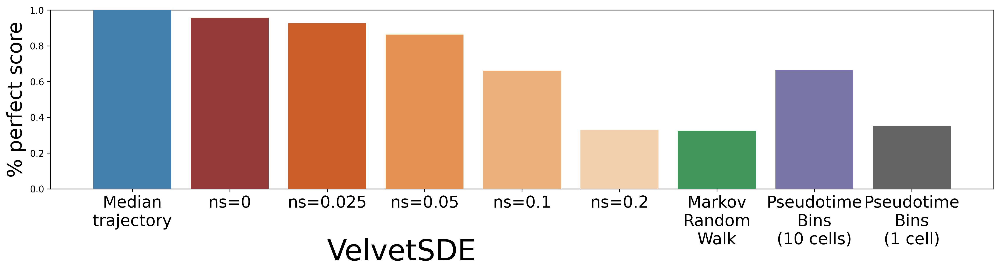

In [13]:
pal = {v:c for v,c in zip(df.Method.values, [colpal.cat2[0],'brown', colpal.cat2[4],colpal.cat2[5],colpal.cat2[6],
                           colpal.cat2[7],colpal.cat2[8],colpal.cat2[12],colpal.cat2[16]])}

plt.figure(figsize=(15.5,4), dpi=300)
sns.barplot(x='Method',y='Score', data=df, zorder=3, palette=pal)
plt.xlabel('')
plt.ylabel("% perfect score", fontsize=22)
plt.xticks(fontsize=18)
# plt.grid(alpha=0.5, zorder=0)
plt.ylim((0,1))

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

    # Loop over the axes in the figure
    for ax in fig.get_axes():
        # Set the axes facecolor to white
        ax.set_facecolor('white')
plt.tight_layout()
plt.text(2,-.4,'VelvetSDE', fontsize=32)
plt.plot([1,4],[-1,-1])
plt.savefig('../figures/3.2.0_ordering_score.png', bbox_inches='tight')
plt.show()

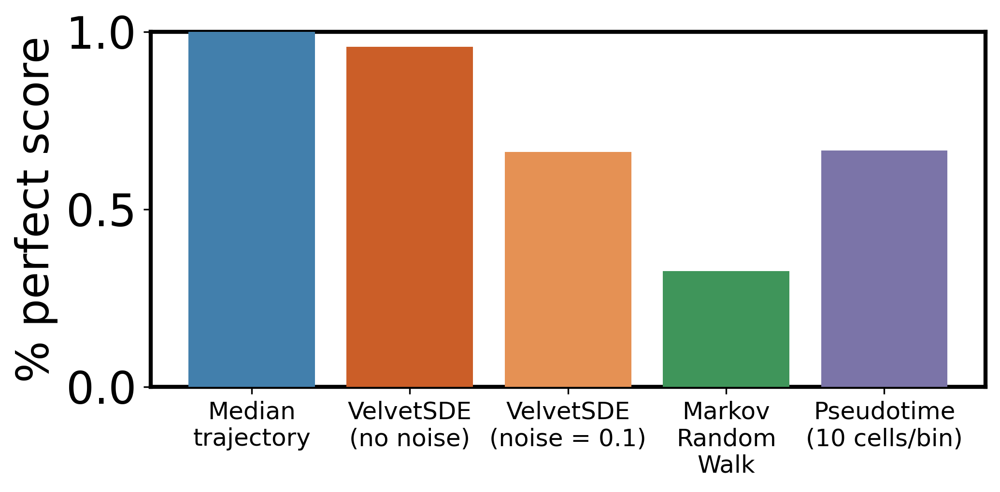

In [30]:
df = pd.DataFrame(
    {'Method':[
        'Median\ntrajectory',
        'VelvetSDE\n(no noise)',
        'VelvetSDE\n(noise = 0.1)',
        'Markov\nRandom\nWalk',
        'Pseudotime\n(10 cells/bin)'],
     'Score':[ave_score, clean_score, noisy1_score, markov_score, p10_score]
    }
)

pal = {v:c for v,c in zip(df.Method.values, [colpal.cat2[0],colpal.cat2[4],colpal.cat2[5],
                           colpal.cat2[8],colpal.cat2[12],colpal.cat2[16]])}


plt.figure(figsize=(7,3.5), dpi=300)
sns.barplot(x='Method',y='Score', data=df, zorder=3, palette=pal)
plt.xlabel('')
plt.ylabel("% perfect score", fontsize=22)
plt.xticks(fontsize=12)
plt.yticks([0,0.5,1], fontsize=22)
plt.ylim((0,1))

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

    # Loop over the axes in the figure
    for ax in fig.get_axes():
        # Set the axes facecolor to white
        ax.set_facecolor('white')
        for spine in ax.spines.values():
            spine.set_visible(True)  # Make sure spine is visible
            spine.set_color('black')  # Set the color of the spine
            spine.set_linewidth(2) 
        
plt.tight_layout()
# plt.text(2,-.4,'VelvetSDE', fontsize=32)
plt.plot([1,4],[-1,-1])
plt.savefig('../figures/3.2.01_ordering_score_simple.png', bbox_inches='tight')
plt.show()

# further

In [9]:
def random_walk(n, sigma=.1, steps=100, device='cuda'):
    pos = torch.zeros(n, device=device)
    rw = [pos.clone()]
    for i in range(steps-1):
        step = torch.randn(n, device=device)*sigma
        pos = pos + step
        rw.append(pos.clone())
    rw = torch.stack(rw)
    return rw

with open('../data/F4_noisy0.0_trajectories.pickle', 'rb') as f:
    data = pickle.load(f)
    
ave = data['MN']
average_trajectory = ave.median(0).values
inits = ave[:,0,:]

null = (inits.unsqueeze(1) + (average_trajectory - average_trajectory[0]).unsqueeze(0))
for i in range(null.shape[0]):
    null[i] = null[i] + random_walk(50, steps=100, sigma=0.1)
    
nullgex = model.get_trajectory_gene_expression(null)

In [10]:
orderings = [
['Sox2','Olig2'],
['Olig2','Neurog2'],
['Neurog2','Mnx1'],
['Neurod4','Isl1'],
['Mnx1','Tubb3'],
['Olig2','Hmcn1'],
['Olig2','Spice1']
]

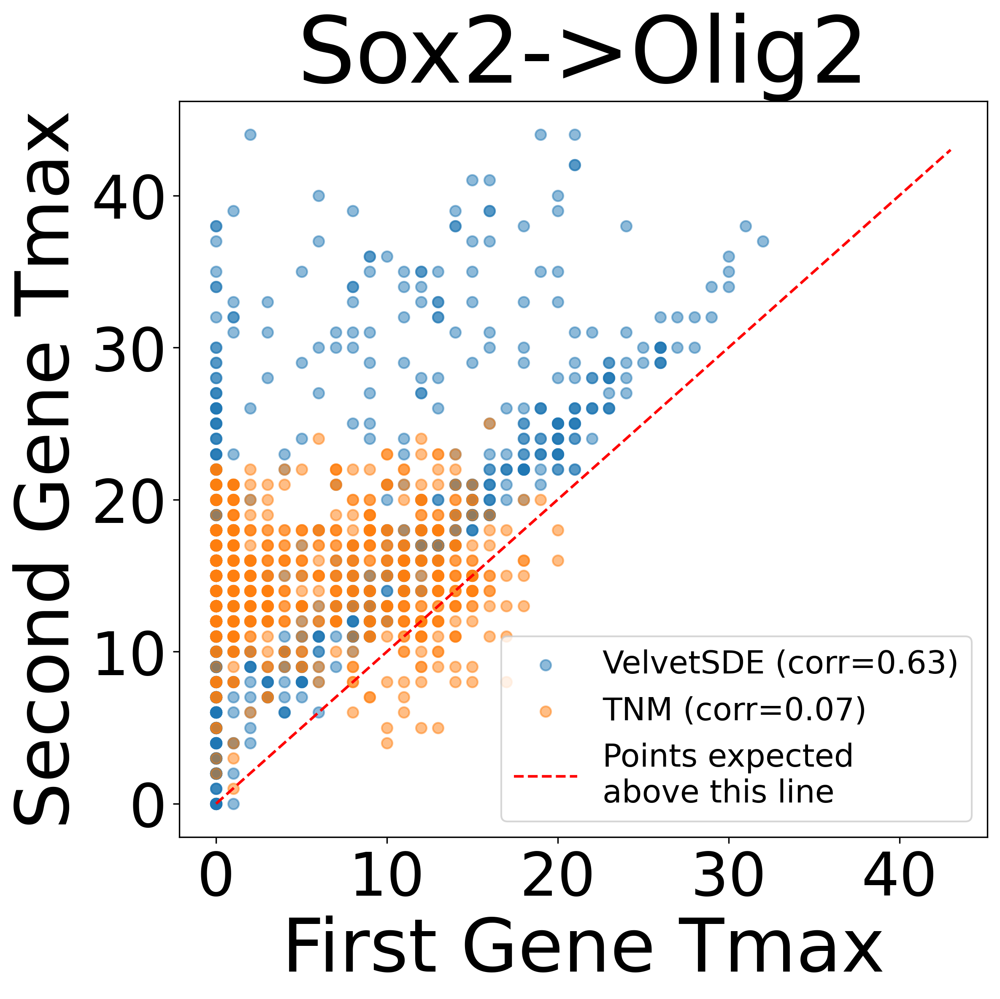

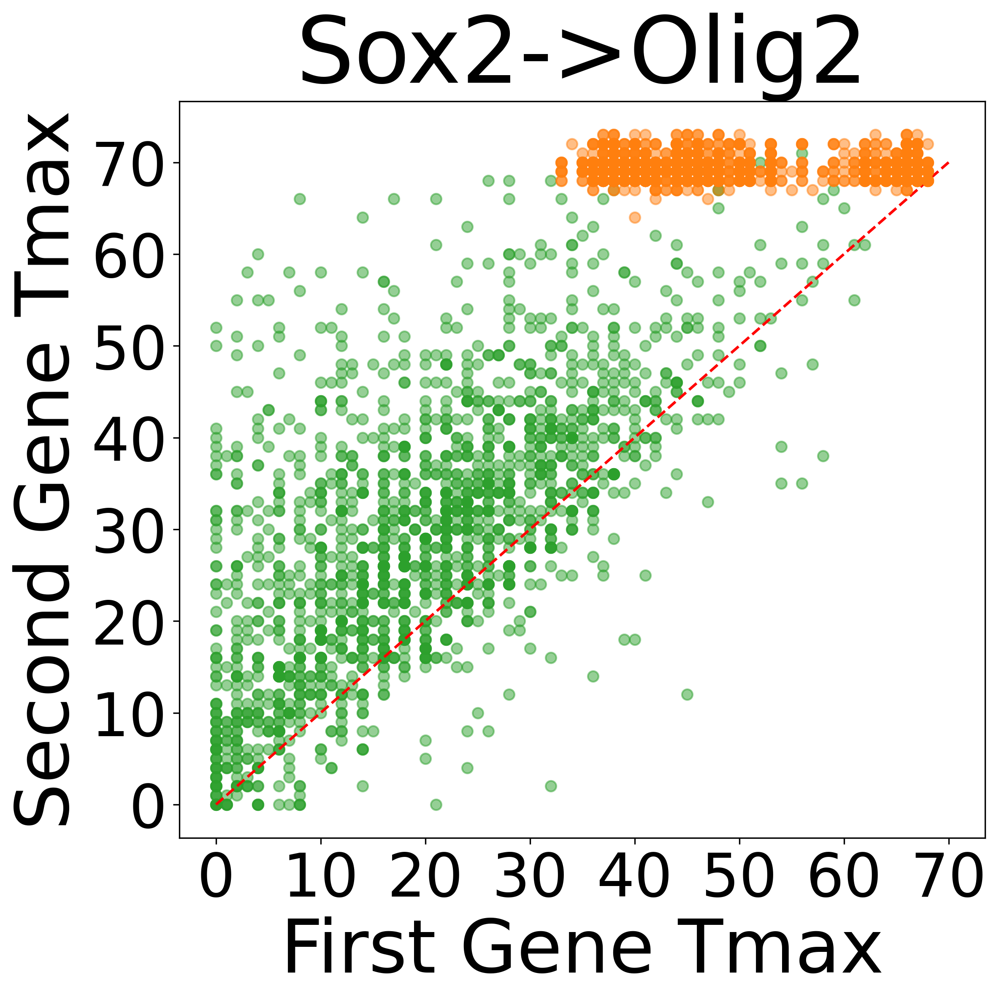

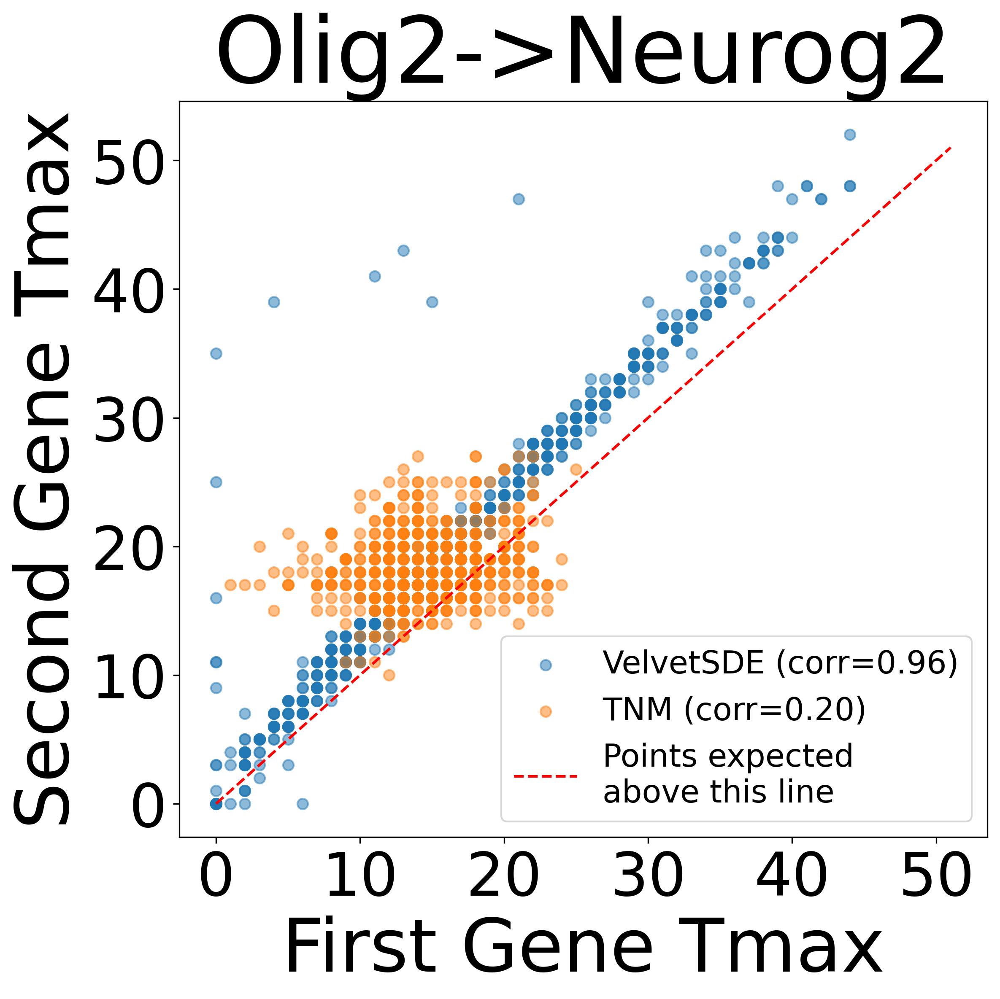

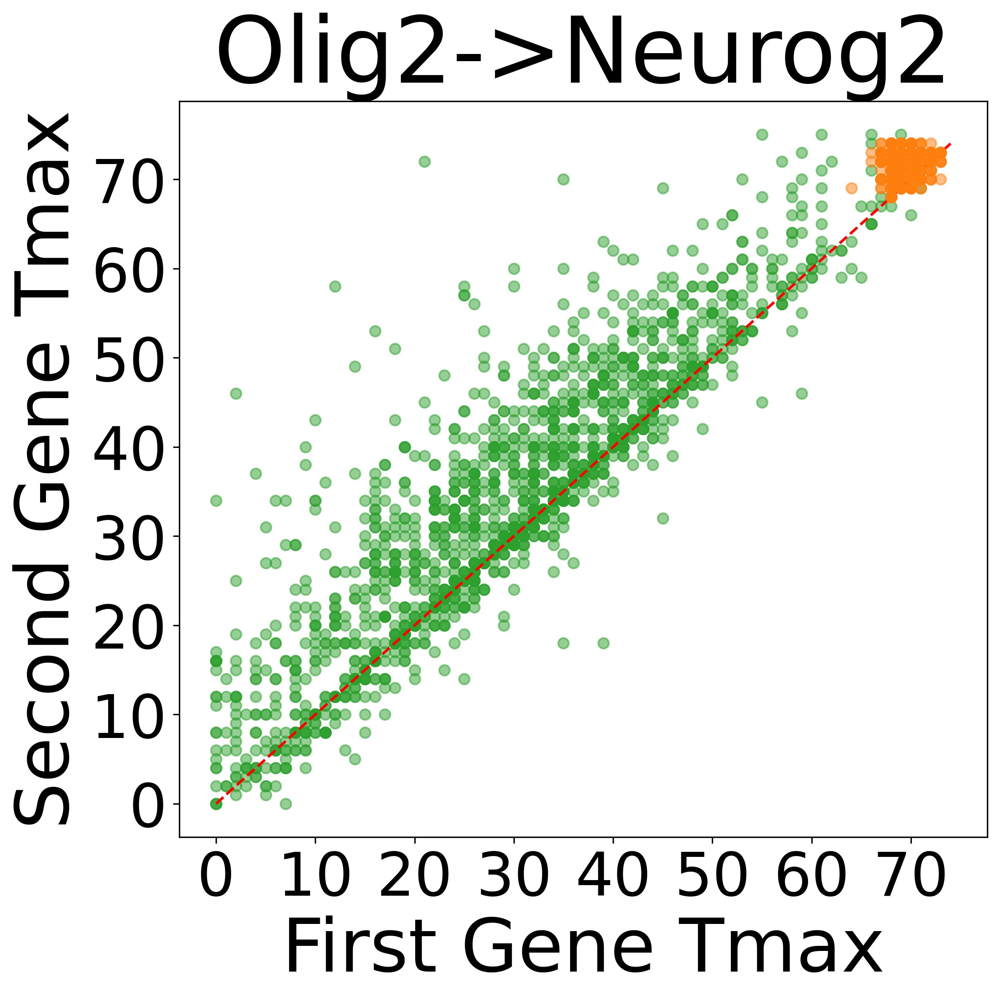

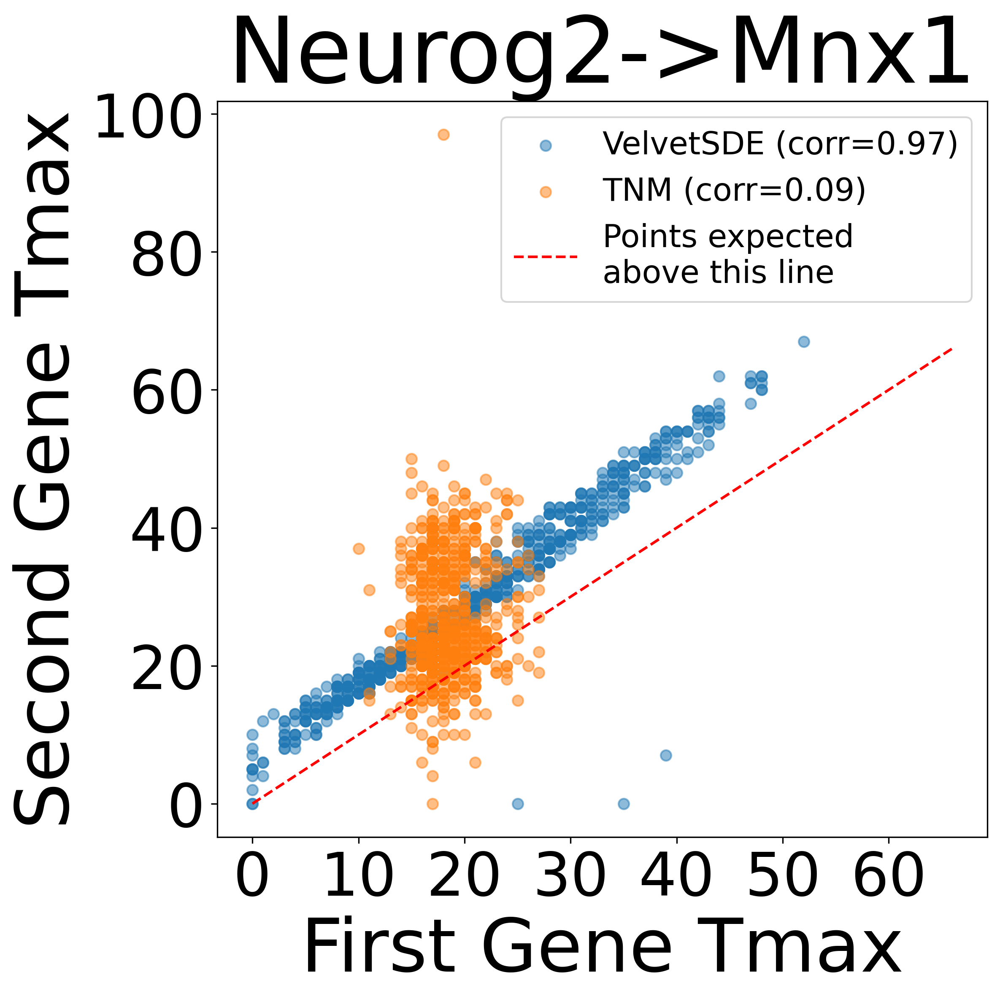

...

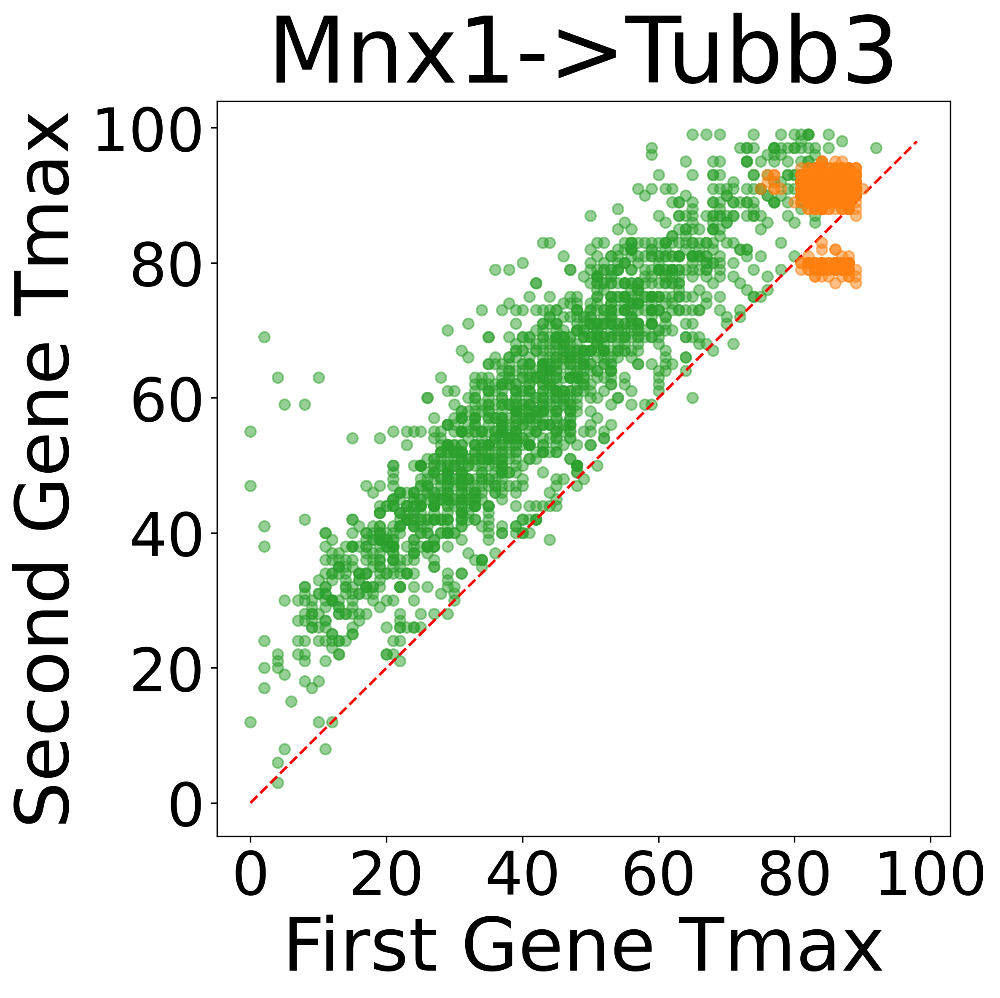

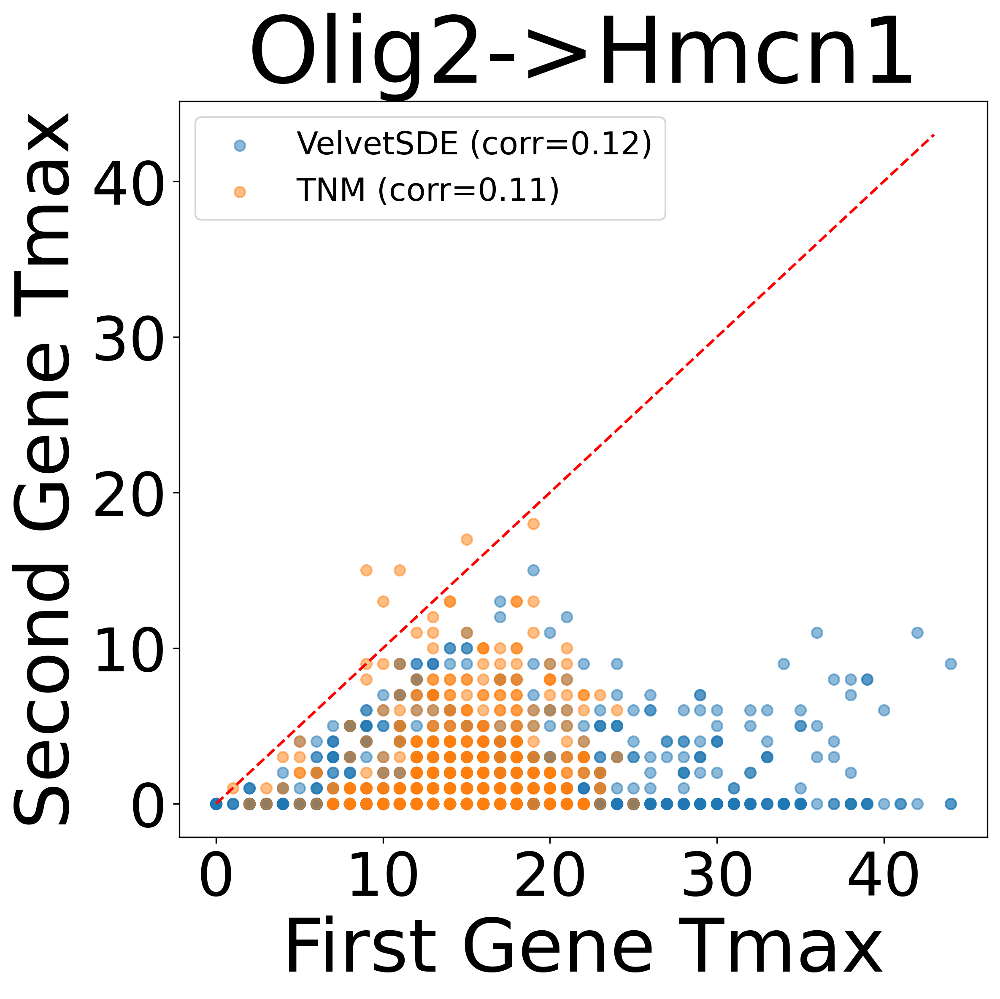

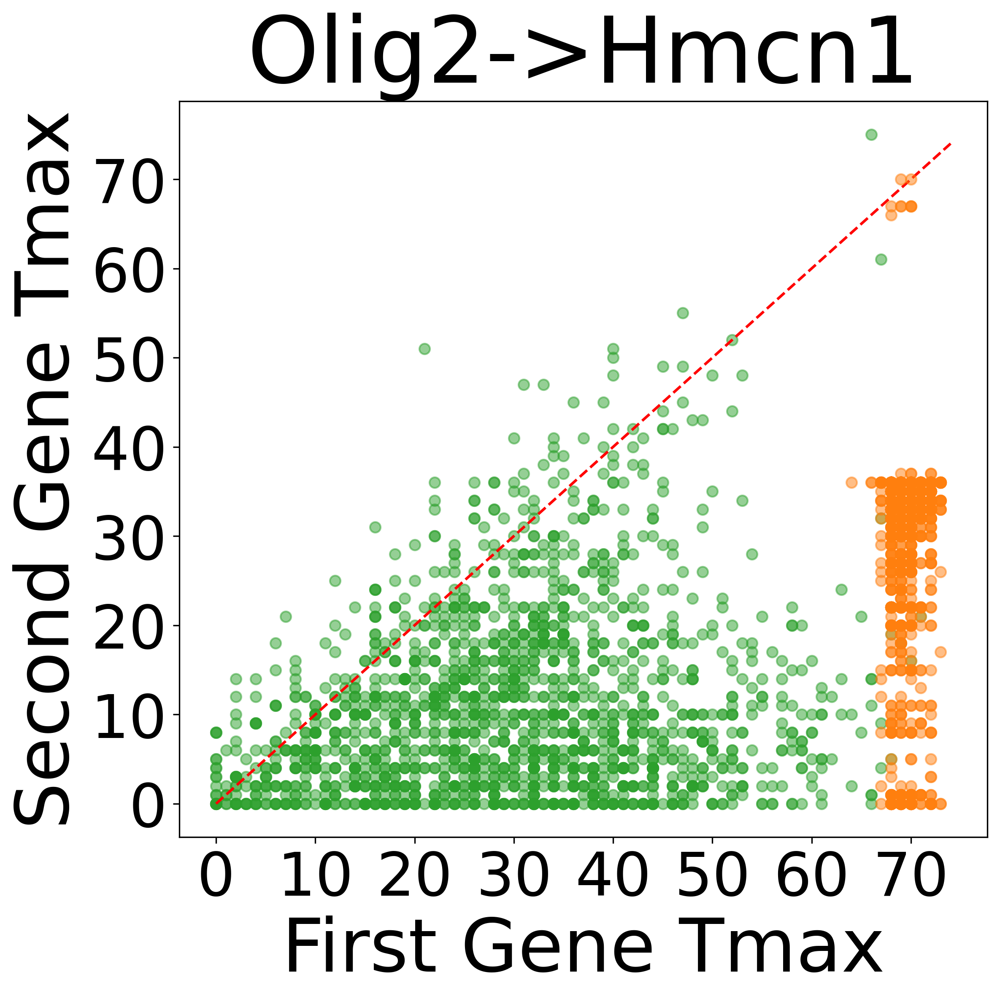

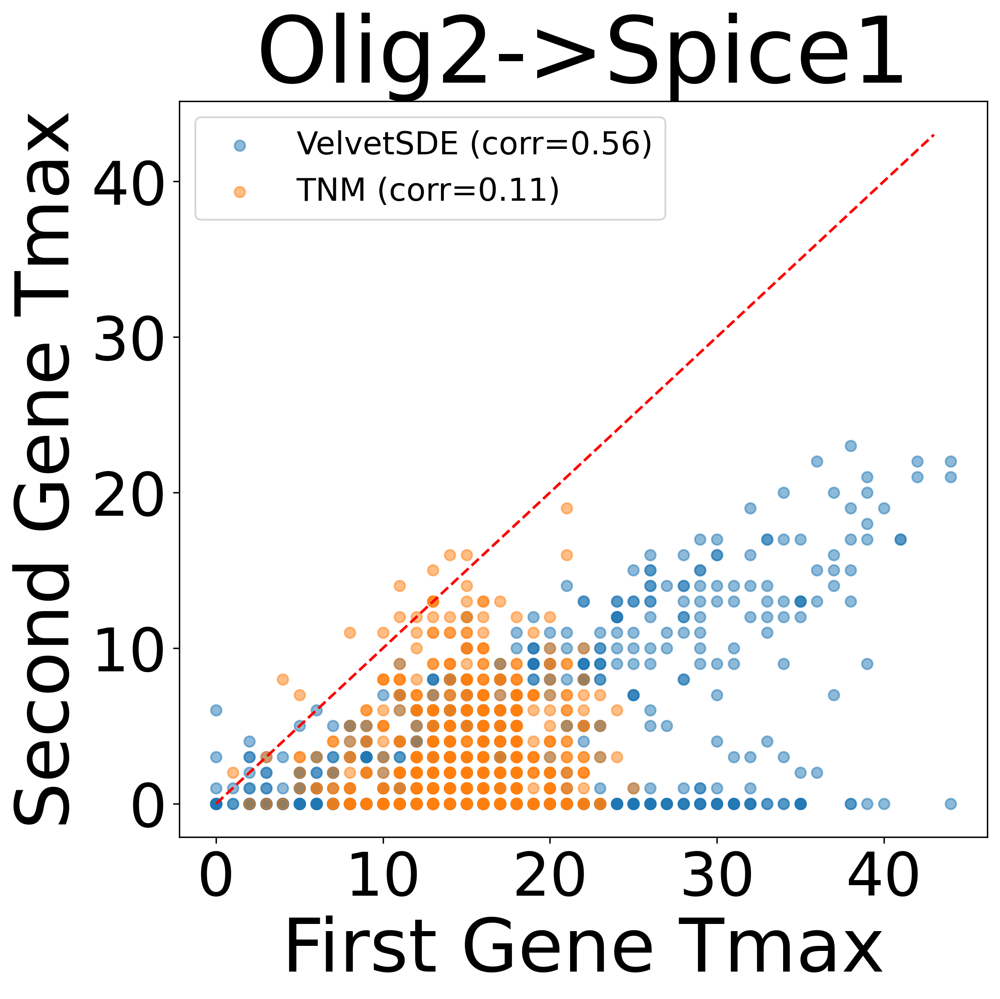

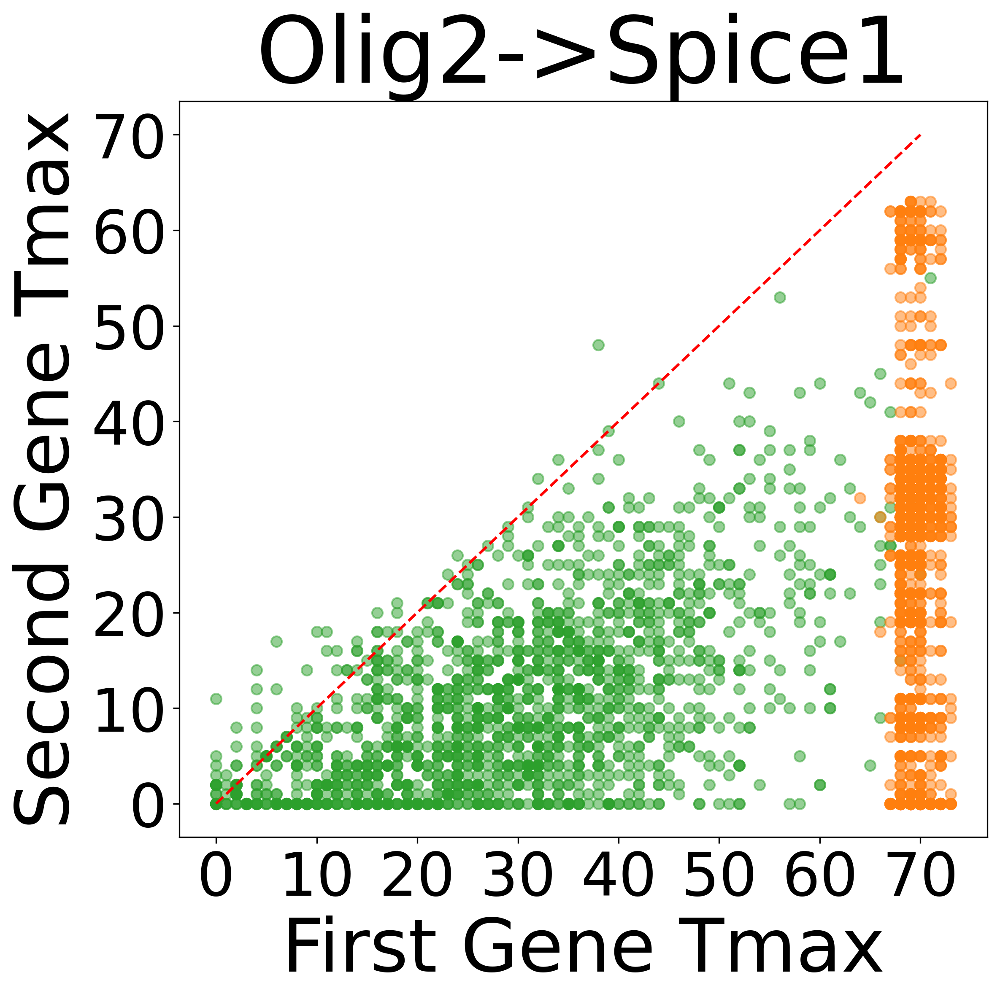

In [11]:
for io, o in enumerate(orderings):
    with open(f'../data/F4_clean_trajectories.pickle', 'rb') as f:
        clen = pickle.load(f)
    with open(f'../data/F4_noisy0.0_trajectories.pickle', 'rb') as f:
        nsde = pickle.load(f)
    with open(f'../data/F4_markov_trajectories.pickle', 'rb') as f:
        mark = pickle.load(f)
    with open(f'../data/F4_pt10_bins.pickle', 'rb') as f:
        pt10 = pickle.load(f)
    with open(f'../data/F4_pt1_bins.pickle', 'rb') as f:
        pt1_ = pickle.load(f)

    trajectories = nsde['MN']
    gex = model.get_trajectory_gene_expression(trajectories)

    first = gex[:,:,np.where(adata.var_names==o[0])[0][0]].detach().cpu().numpy()
    second = gex[:,:,np.where(adata.var_names==o[1])[0][0]].detach().cpu().numpy()
    
    fnull = nullgex[:,:,np.where(adata.var_names==o[0])[0][0]].detach().cpu().numpy() 
    snull = nullgex[:,:,np.where(adata.var_names==o[1])[0][0]].detach().cpu().numpy()

    plt.figure(figsize=(8,8), dpi=300)
    
    sd_coef = np.corrcoef(first.argmax(1), second.argmax(1))[0,1]
    nl_coef = np.corrcoef(fnull.argmax(1), snull.argmax(1))[0,1]
    
    plt.scatter(first.argmax(1), second.argmax(1), alpha=0.5, label=f'VelvetSDE (corr={sd_coef:.2f})')
    plt.scatter(fnull.argmax(1), snull.argmax(1), alpha=0.5, label=f'TNM (corr={nl_coef:.2f})')

    if o[1] in ['Hmcn1','Spice1']:
        lab = ''
    else:
        lab = 'Points expected\nabove this line'
    
    plt.plot(
        np.arange(np.concatenate((first.argmax(1), second.argmax(1))).max()),
        np.arange(np.concatenate((first.argmax(1), second.argmax(1))).max()),
        c='r', linestyle='--', label=lab
    )
    
    
    plt.xlabel("First Gene Tmax", fontsize=42)
    plt.ylabel("Second Gene Tmax", fontsize=42)
    plt.xticks(fontsize=34)
    plt.yticks(fontsize=34)
    plt.title(f"{o[0]}->{o[1]}", fontsize=52)
    plt.legend(fontsize=18)
    
    for fig in plt.get_fignums():
        fig = plt.figure(fig)
        # Set the figure facecolor to transparent
        fig.patch.set_facecolor('none')

        # Loop over the axes in the figure
        for ax in fig.get_axes():
            # Set the axes facecolor to white
            ax.set_facecolor('white')
    plt.tight_layout()
    #plt.savefig(f'../figures/3.2.{io*2}_{o[0]}_{o[1]}_SDE_TNM.png', bbox_inches='tight')
    
    plt.show()

    # # # # 
    
    plt.figure(figsize=(8,8), dpi=300)

    trajectories = pt10['MN']
    gex = model.get_trajectory_gene_expression(trajectories)
    first = gex[:,:,np.where(adata.var_names==o[0])[0][0]].detach().cpu().numpy()
    second = gex[:,:,np.where(adata.var_names==o[1])[0][0]].detach().cpu().numpy()
    plt.scatter(first.argmax(1), second.argmax(1), zorder=10,
                alpha=0.5, label='Pseudotime (10 cells)', color='tab:orange')

    trajectories = mark['MN']
    gex = model.get_trajectory_gene_expression(trajectories)
    first = gex[:,:,np.where(adata.var_names==o[0])[0][0]].detach().cpu().numpy()
    second = gex[:,:,np.where(adata.var_names==o[1])[0][0]].detach().cpu().numpy()
    plt.scatter(first.argmax(1), second.argmax(1), alpha=0.5, label='Markov Walk', color='tab:green')

    plt.plot(
        np.arange(np.concatenate((first.argmax(1), second.argmax(1))).max()),
        np.arange(np.concatenate((first.argmax(1), second.argmax(1))).max()),
        c='r', linestyle='--'
    )
    plt.xlabel("First Gene Tmax", fontsize=42)
    plt.ylabel("Second Gene Tmax", fontsize=42)
    plt.xticks(fontsize=34)
    plt.yticks(fontsize=34)
    plt.title(f"{o[0]}->{o[1]}", fontsize=52)
    #plt.legend(fontsize=18)
    
    for fig in plt.get_fignums():
        fig = plt.figure(fig)
        # Set the figure facecolor to transparent
        fig.patch.set_facecolor('none')

        # Loop over the axes in the figure
        for ax in fig.get_axes():
            # Set the axes facecolor to white
            ax.set_facecolor('white')
    plt.tight_layout()
    #plt.savefig(f'../figures/3.2.{io*2}_{o[0]}_{o[1]}_PT_MRW.png', bbox_inches='tight')
    
    plt.show()

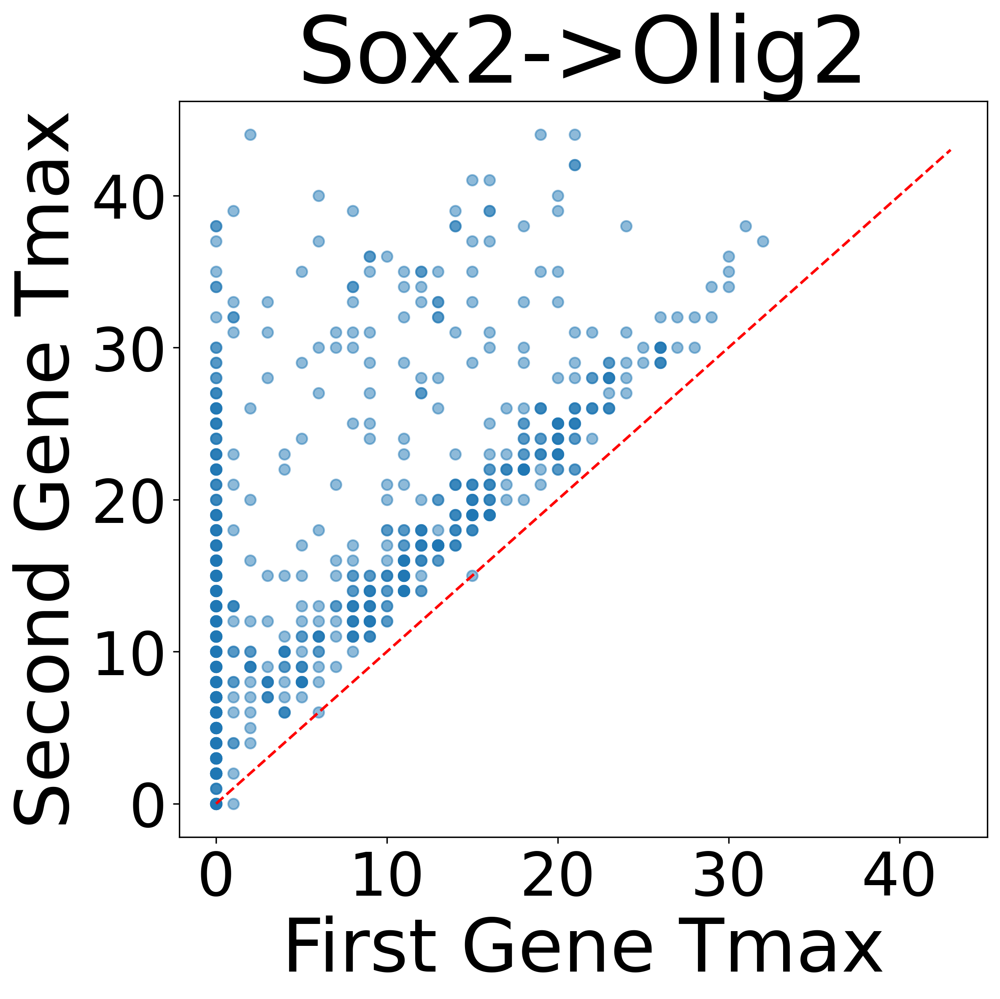

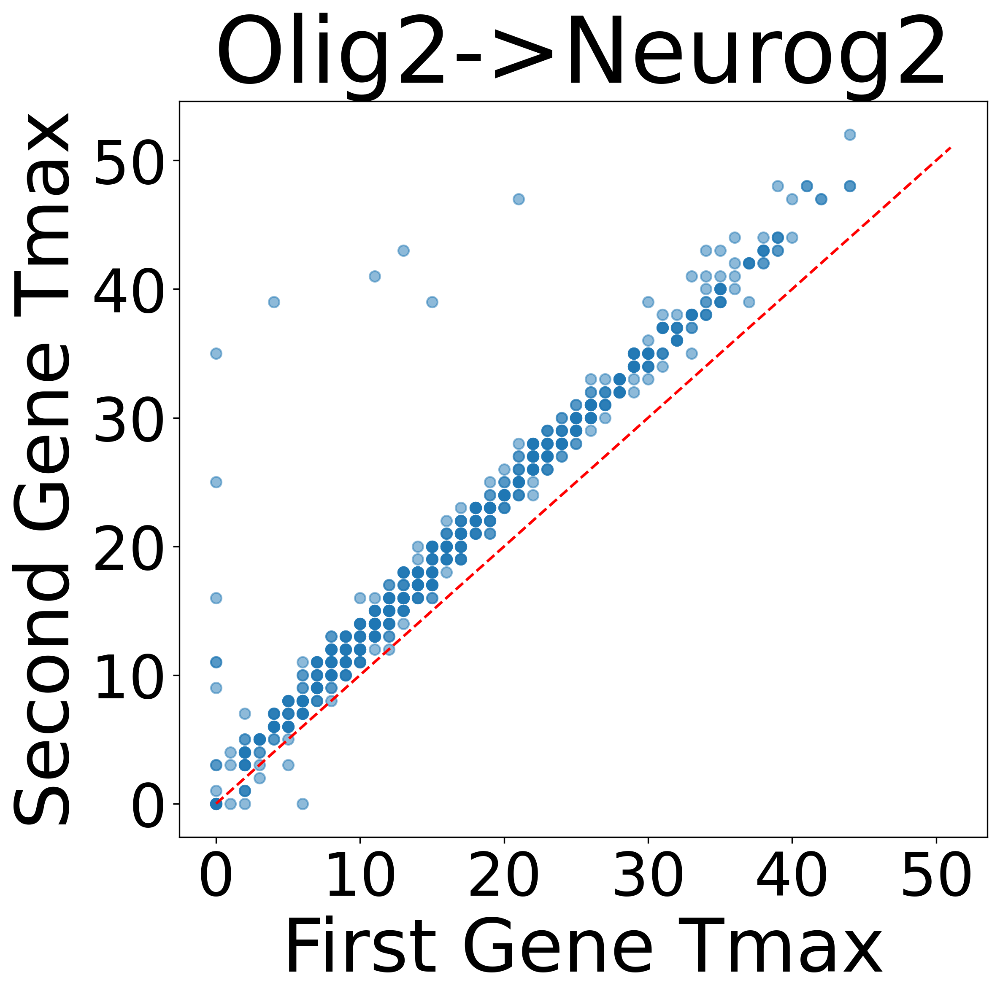

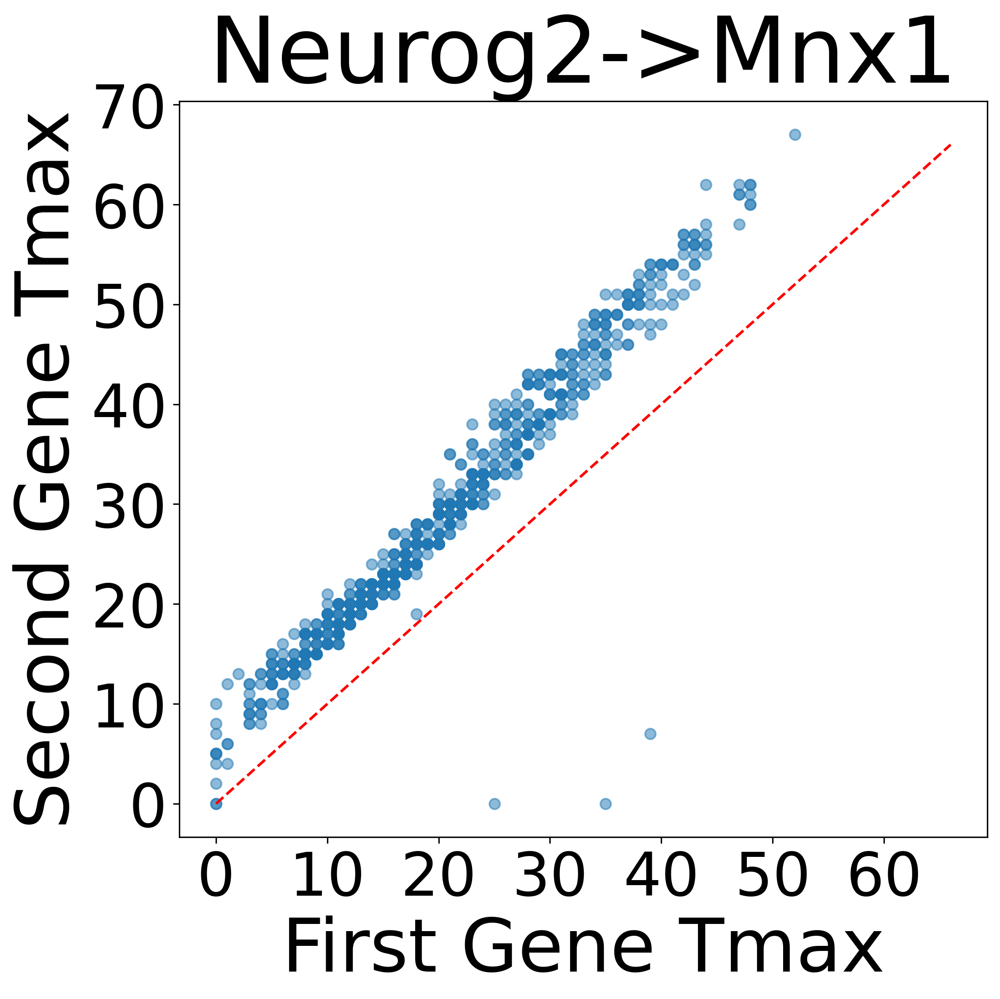

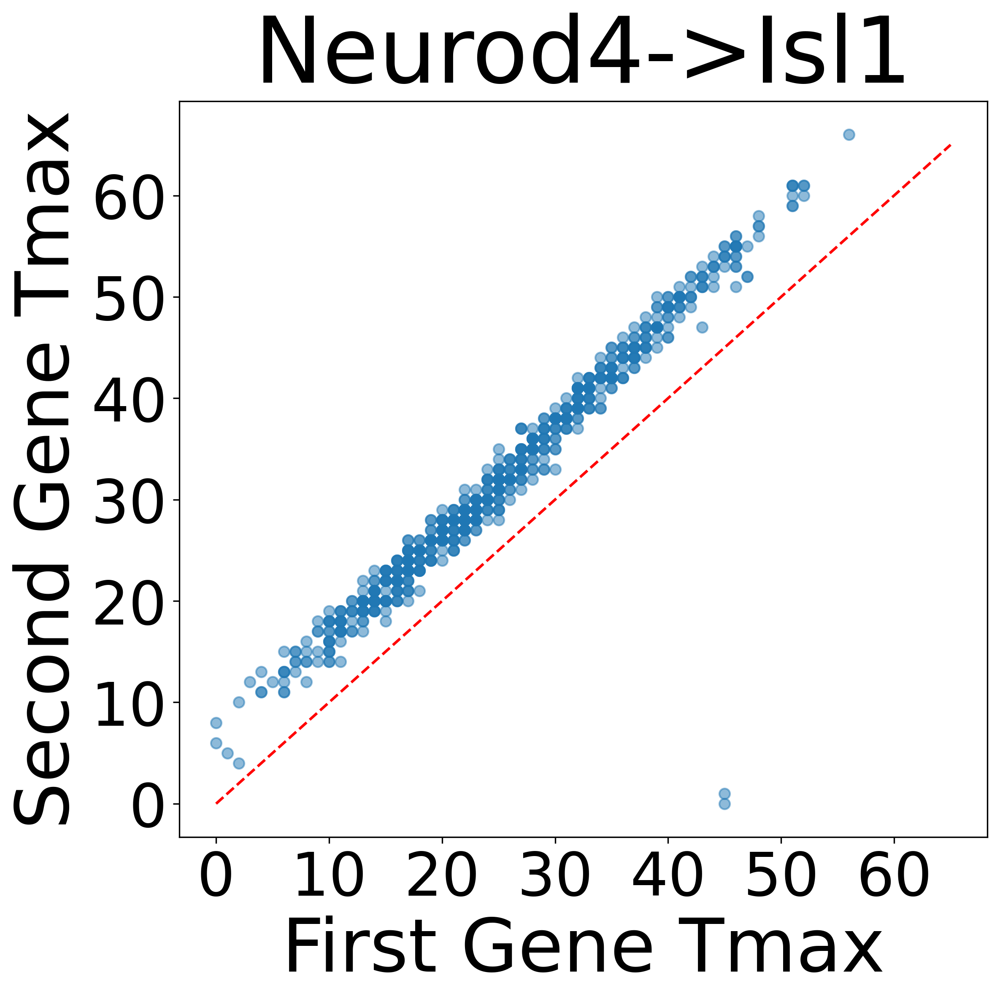

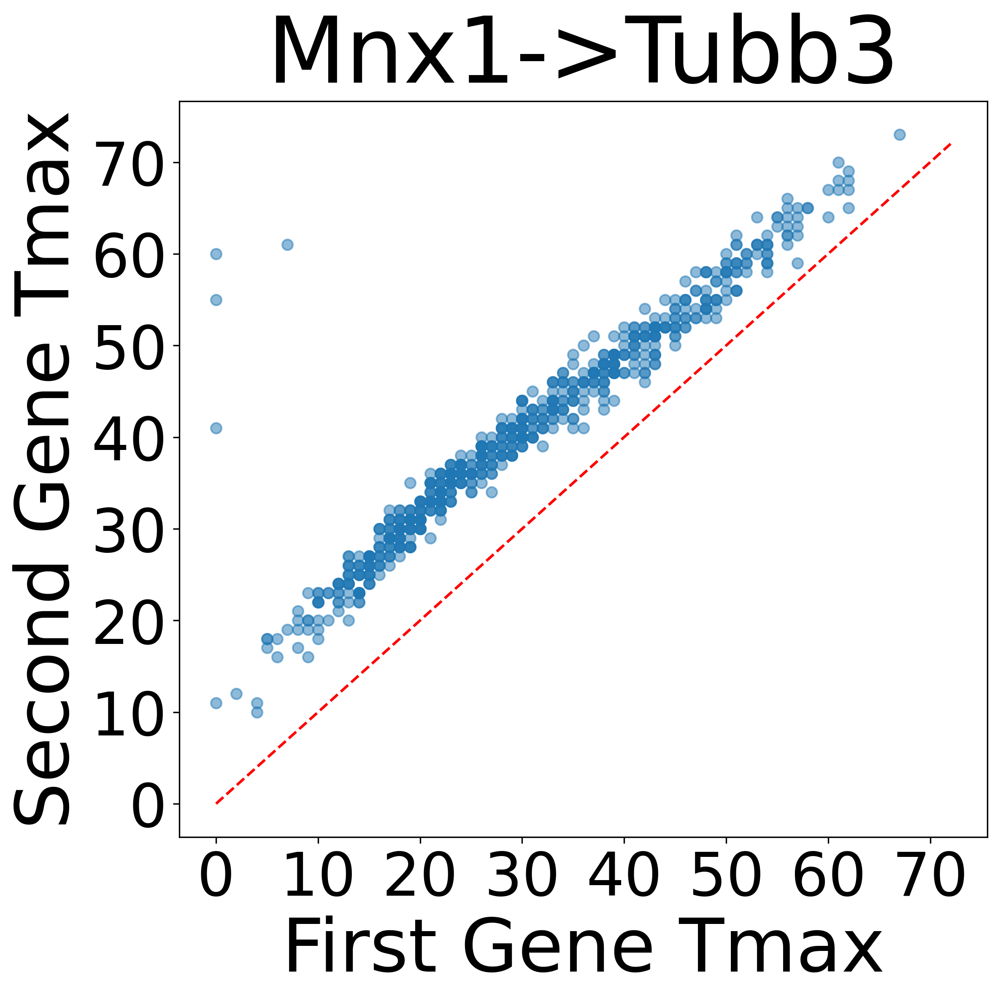

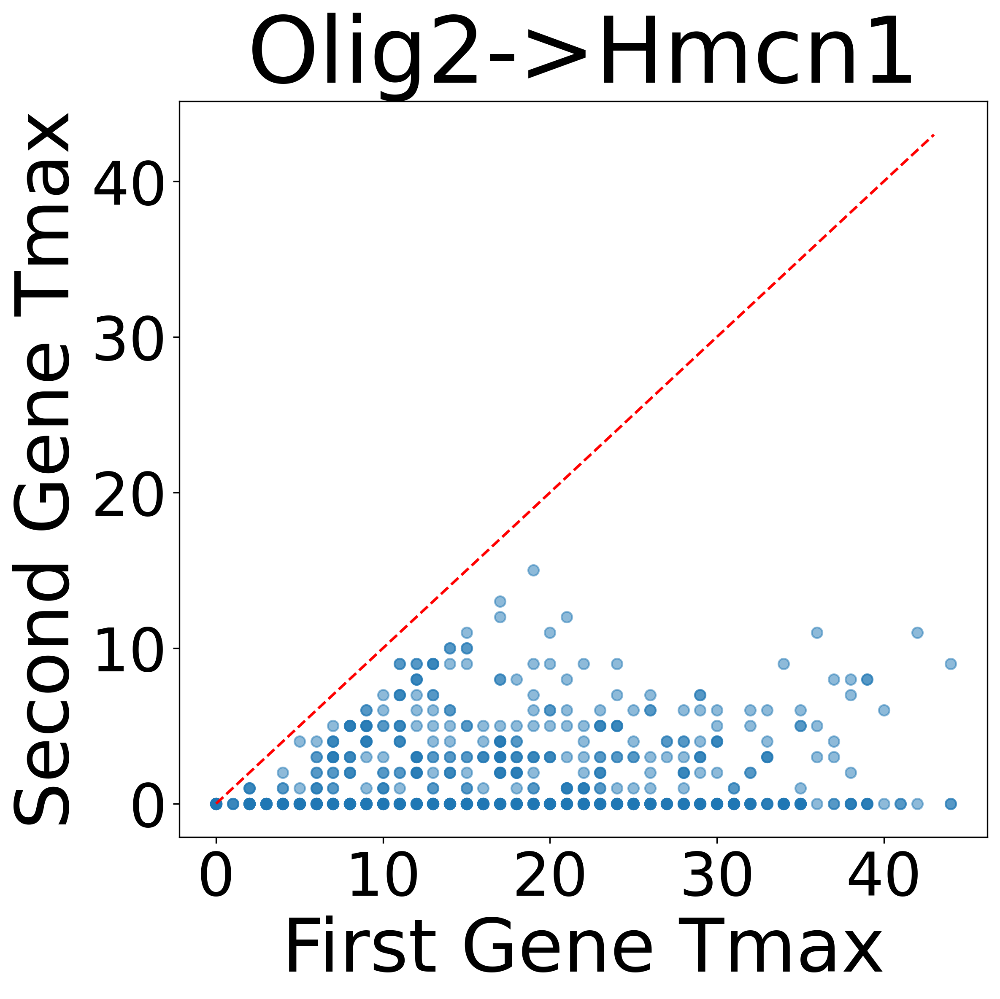

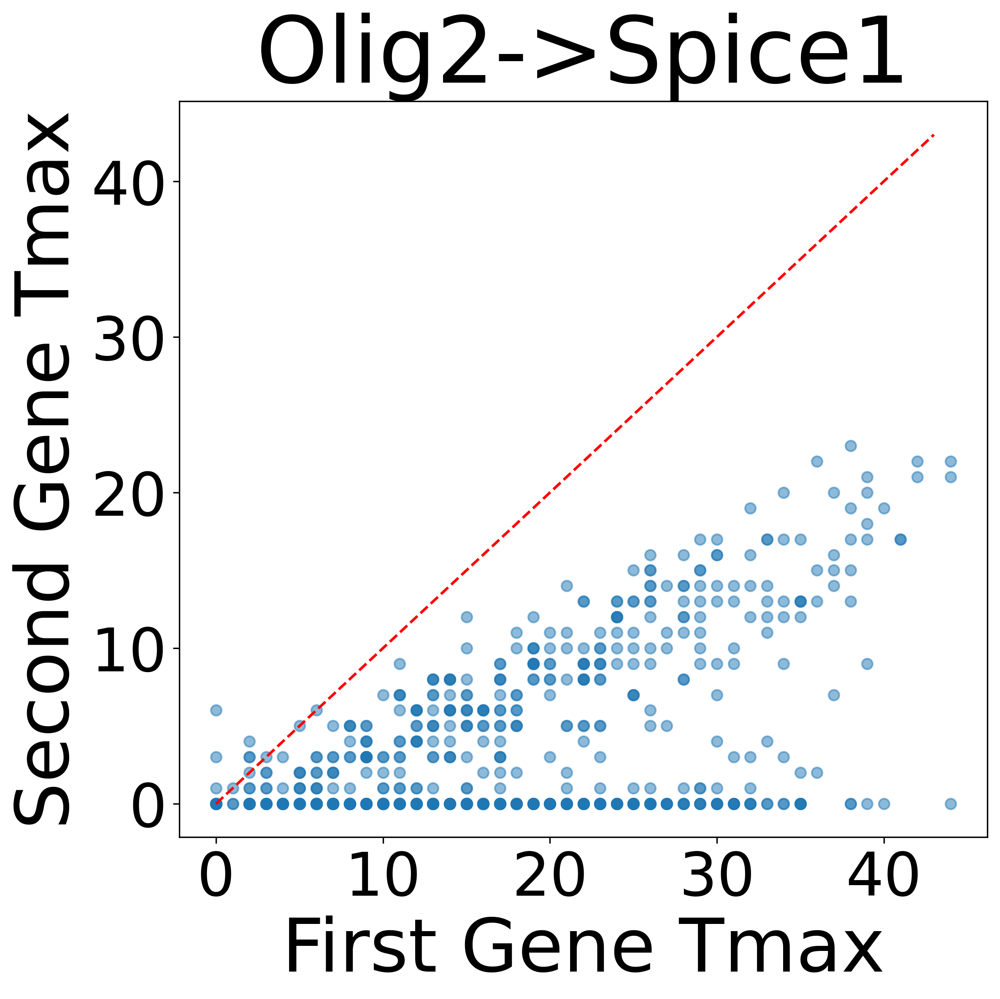

In [31]:
for io, o in enumerate(orderings):
    with open(f'../data/F4_noisy0.0_trajectories.pickle', 'rb') as f:
        nsde = pickle.load(f)
    with open(f'../data/F4_markov_trajectories.pickle', 'rb') as f:
        mark = pickle.load(f)
    with open(f'../data/F4_pt10_bins.pickle', 'rb') as f:
        pt10 = pickle.load(f)
    with open(f'../data/F4_pt1_bins.pickle', 'rb') as f:
        pt1_ = pickle.load(f)

    trajectories = nsde['MN']
    gex = model.get_trajectory_gene_expression(trajectories)

    first = gex[:,:,np.where(adata.var_names==o[0])[0][0]].detach().cpu().numpy()
    second = gex[:,:,np.where(adata.var_names==o[1])[0][0]].detach().cpu().numpy()
    plt.figure(figsize=(8,8), dpi=300)
    
    sd_coef = np.corrcoef(first.argmax(1), second.argmax(1))[0,1]
    nl_coef = np.corrcoef(fnull.argmax(1), snull.argmax(1))[0,1]
    
    plt.scatter(first.argmax(1), second.argmax(1), alpha=0.5, label=f'VelvetSDE (corr={sd_coef:.2f})')

    if o[1] in ['Hmcn1','Spice1']:
        lab = ''
    else:
        lab = 'Points expected above this line'
    
    plt.plot(
        np.arange(np.concatenate((first.argmax(1), second.argmax(1))).max()),
        np.arange(np.concatenate((first.argmax(1), second.argmax(1))).max()),
        c='r', linestyle='--', label=lab
    )
    
    
    plt.xlabel("First Gene Tmax", fontsize=42)
    plt.ylabel("Second Gene Tmax", fontsize=42)
    plt.xticks(fontsize=34)
    plt.yticks(fontsize=34)
    plt.title(f"{o[0]}->{o[1]}", fontsize=52)
    #plt.legend(fontsize=18)
    
    for fig in plt.get_fignums():
        fig = plt.figure(fig)
        # Set the figure facecolor to transparent
        fig.patch.set_facecolor('none')

        # Loop over the axes in the figure
        for ax in fig.get_axes():
            # Set the axes facecolor to white
            ax.set_facecolor('white')
    plt.tight_layout()
    plt.savefig(f'../figures/3.2.{io*2}_{o[0]}_{o[1]}_SDE_only.png', bbox_inches='tight')
    
    plt.show()


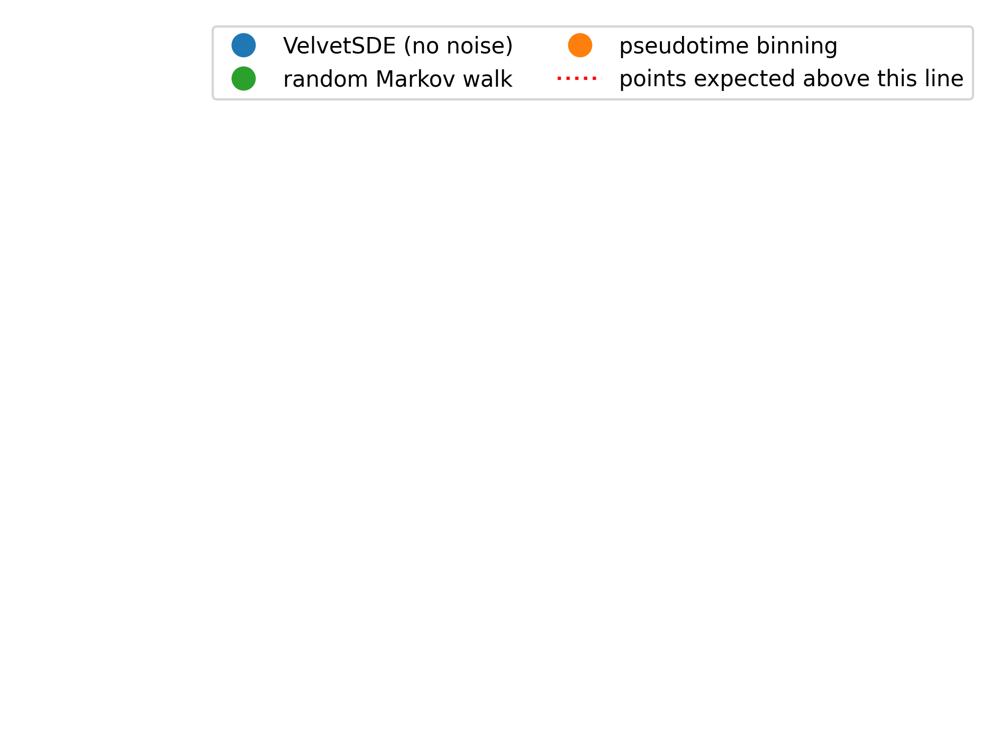

In [3]:
import matplotlib.pyplot as plt
import matplotlib.lines as mlines

# Create legend elements
redLine = mlines.Line2D([], [], color='red', linestyle='dotted', markersize=10, label='points expected above this line')
velvetSDE = mlines.Line2D([], [], color='tab:blue', marker='o', linestyle='None', markersize=10, label='VelvetSDE (no noise)')
randomWalk = mlines.Line2D([], [], color='tab:green', marker='o', linestyle='None', markersize=10, label='random Markov walk')
pseudoBinning = mlines.Line2D([], [], color='tab:orange', marker='o', linestyle='None', markersize=10, label='pseudotime binning')


plt.figure(dpi=300)

# Create the legend with 3 columns
plt.legend(handles=[velvetSDE, randomWalk, pseudoBinning, redLine], ncol=2)

# Remove xticks, yticks, and grid
plt.xticks([])
plt.yticks([])
plt.grid(False)

# Remove borders
plt.box(False)

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

    # Loop over the axes in the figure
    for ax in fig.get_axes():
        # Set the axes facecolor to white
        ax.set_facecolor('white')
plt.tight_layout()

plt.savefig('../figures/3.2.11_legend.png')
plt.show()
